# yolo練習

---



# tensorflowダウングレード（必須）

In [2]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [3]:
import tensorflow as tf
print(tf.__version__)

1.15.2


# 初回のみ実行

In [10]:
# yoloリポジトリclone
!git clone https://github.com/qqwweee/keras-yolo3.git

Cloning into 'keras-yolo3'...
remote: Enumerating objects: 144, done.
remote: Total 144 (delta 0), reused 0 (delta 0), pack-reused 144
Receiving objects: 100% (144/144), 151.08 KiB | 409.00 KiB/s, done.
Resolving deltas: 100% (65/65), done.


KeyboardInterrupt: ignored

In [0]:
# 学習済みのモデルをダウンロード
!wget https://pjreddie.com/media/files/yolov3.weights

--2020-04-18 02:44:09--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M   470KB/s    in 7m 5s   

2020-04-18 02:51:16 (569 KB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [0]:
# モデルをkeras用にconvert
!python ./keras-yolo3/convert.py ./keras-yolo3/yolov3.cfg yolov3.weights ./keras-yolo3/model_data/yolo.h5

Using TensorFlow backend.
2020-04-18 03:03:12.281588: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Loading weights.
Weights Header:  0 2 0 [32013312]
Parsing Darknet config.
Creating Keras model.
Parsing section net_0
Parsing section convolutional_0
conv2d bn leaky (3, 3, 3, 32)
2020-04-18 03:03:14.432253: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-04-18 03:03:14.498291: E tensorflow/stream_executor/cuda/cuda_driver.cc:313] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2020-04-18 03:03:14.498384: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (7e5c01328335): /proc/driver/nvidia/version does not exist
2020-04-18 03:03:14.538688: I tensorflow/core/platform/profile_utils/cpu_utils.cc:102] CPU Frequency: 2200000000 Hz
2020-04-18 03:03:14.53908

# モデルをkerasで読み込んでみる

In [4]:
import keras

Using TensorFlow backend.


In [5]:
model = keras.models.load_model('./keras-yolo3/model_data/yolo.h5', compile=False)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [6]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
leaky_re_lu_1 (LeakyReLU)       (None, None, None, 3 0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

# 学習済みモデルを用いて試す
画像はここからパクった  
(http://nw.tsuda.ac.jp/lec/DeepLearning/keras/YOLO_v3/Keras_YOLO_v3.html)

In [7]:
%cd keras-yolo3

/content/keras-yolo3


keras-yolo3 の yolo_video.py を使って結果を表示する（なぜか結果が表示されなかった←GPUメモリが足りない？）

In [10]:
# 画像
!python yolo_video.py --image
# 動画
#!python yolo_video.py --input 動画ファイル名 --output 保存ファイル名

Using TensorFlow backend.
Image detection mode
 Ignoring remaining command line arguments: ./path2your_video,
2020-04-18 03:36:15.896167: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-04-18 03:36:15.898000: E tensorflow/stream_executor/cuda/cuda_driver.cc:318] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2020-04-18 03:36:15.898039: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (7e5c01328335): /proc/driver/nvidia/version does not exist
2020-04-18 03:36:15.903379: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2200000000 Hz
2020-04-18 03:36:15.903587: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x2c0ea00 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-04-18 03:36:15.903618: I tensorflow/compiler/xla/service/service.cc:176]   S

YOLOを直接importして試す

In [3]:
from yolo import YOLO, detect_video
from PIL import Image

Using TensorFlow backend.


In [0]:
image = Image.open('./test_data/yolo_test.jpg')

In [5]:
yolo = YOLO()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
model_data/yolo.h5 model, anchors, and classes loaded.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [6]:
r_image = yolo.detect_image(image)

(416, 416, 3)
Found 2 boxes for img
person 1.00 (4771, 871) (5800, 3643)
person 1.00 (3635, 786) (4762, 3707)
4.703254674999698


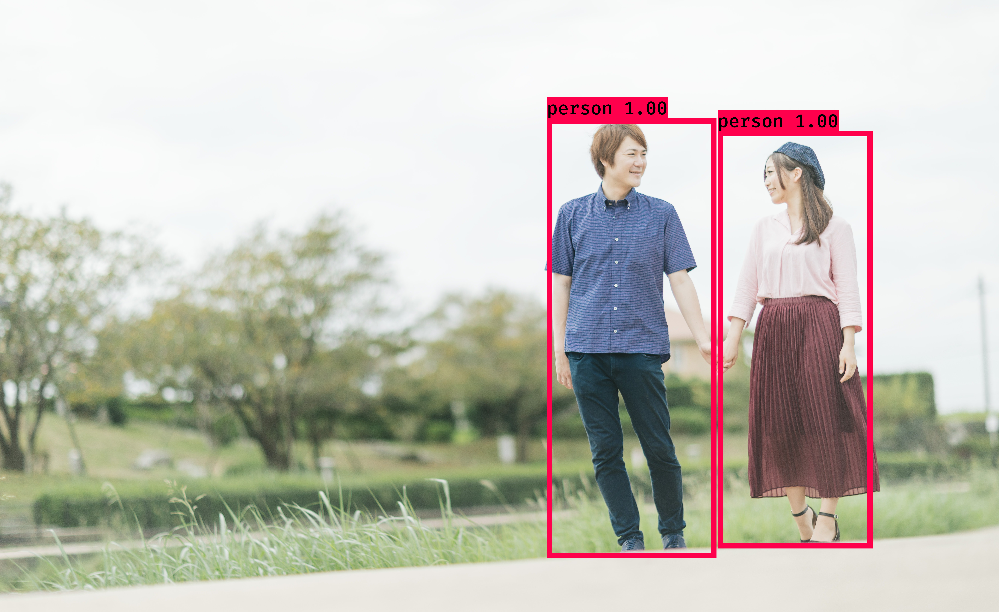

In [9]:
r_image